# Instacart

In this project, we will analyze a dataset from Instacart, looking for insights into buying patterns. The dataset consists on five tables, released by Instacart on Kaggle on 2017.

The first step is to load the neccesary libraries for this project. We are going to use the following:

- pandas will provide the structures and analitic tools to explore the dataset.
- matplotlib.pyplot to visualize the data
- numpy will provide us with useful functions to check the validity of some transformations.

In [1]:
import pandas as pd
from matplotlib import pyplot as plt
import plotly.express as px
import numpy as np
import calendar

## Loading the Dataset

Now we can begin loading the dataset. All the tables use `;` as a separator. We'll go one by one, loading it and geting some basic info. We'll take note of data types that need fixing, and deal with those after we fix the missing values.

In [2]:
def load_data(path: str):
    df = pd.read_csv(path, sep=';')
    print(f'Info on {path}')
    df.info()
    print()
    display(df.head())
    return df;


### `products` data frame

In [3]:
df_products = load_data('datasets/products.csv')

Info on datasets/products.csv
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49694 entries, 0 to 49693
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   product_id     49694 non-null  int64 
 1   product_name   48436 non-null  object
 2   aisle_id       49694 non-null  int64 
 3   department_id  49694 non-null  int64 
dtypes: int64(3), object(1)
memory usage: 1.5+ MB



,product_id,product_name,aisle_id,department_id
0,1,Chocolate Sandwich Cookies,61,19
1,2,All-Seasons Salt,104,13
2,3,Robust Golden Unsweetened Oolong Tea,94,7
3,4,Smart Ones Classic Favorites Mini Rigatoni Wit...,38,1
4,5,Green Chile Anytime Sauce,5,13


Some missing values in product_name.



### `order_products` data frame

In [4]:
df_order_products = load_data('datasets/order_products.csv')

Info on datasets/order_products.csv
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4545007 entries, 0 to 4545006
Data columns (total 4 columns):
 #   Column             Dtype  
---  ------             -----  
 0   order_id           int64  
 1   product_id         int64  
 2   add_to_cart_order  float64
 3   reordered          int64  
dtypes: float64(1), int64(3)
memory usage: 138.7 MB



,order_id,product_id,add_to_cart_order,reordered
0,2141543,11440,17.0,0
1,567889,1560,1.0,1
2,2261212,26683,1.0,1
3,491251,8670,35.0,1
4,2571142,1940,5.0,1


The field `add_to_cart_order` probably doesn't need to be a float. It also has some missing values.

### `aisles` data frame

In [5]:
df_aisles = load_data('datasets/aisles.csv')

Info on datasets/aisles.csv
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 134 entries, 0 to 133
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   aisle_id  134 non-null    int64 
 1   aisle     134 non-null    object
dtypes: int64(1), object(1)
memory usage: 2.2+ KB



,aisle_id,aisle
0,1,prepared soups salads
1,2,specialty cheeses
2,3,energy granola bars
3,4,instant foods
4,5,marinades meat preparation


Seems ok. Next

### `departments` data frame

In [6]:
df_departments = load_data('datasets/departments.csv')

Info on datasets/departments.csv
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21 entries, 0 to 20
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   department_id  21 non-null     int64 
 1   department     21 non-null     object
dtypes: int64(1), object(1)
memory usage: 464.0+ bytes



,department_id,department
0,1,frozen
1,2,other
2,3,bakery
3,4,produce
4,5,alcohol


No issues here. Next.

### `orders` data frame

In [7]:
df_orders = load_data('datasets/instacart_orders.csv')

Info on datasets/instacart_orders.csv
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 478967 entries, 0 to 478966
Data columns (total 6 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   order_id                478967 non-null  int64  
 1   user_id                 478967 non-null  int64  
 2   order_number            478967 non-null  int64  
 3   order_dow               478967 non-null  int64  
 4   order_hour_of_day       478967 non-null  int64  
 5   days_since_prior_order  450148 non-null  float64
dtypes: float64(1), int64(5)
memory usage: 21.9 MB



,order_id,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order
0,1515936,183418,11,6,13,30.0
1,1690866,163593,5,5,12,9.0
2,1454967,39980,4,5,19,2.0
3,1768857,82516,56,0,20,10.0
4,3007858,196724,2,4,12,17.0


There are some missing values in `days_since_prior_order`. This alone will make it a float instead of an int. There might be some values with decimals, if the calculation takes into consideration the order_hour_of_day of the orders. However, since the first rows don't have any, it's unlikely.

We'll check before trying to do a conversion.

## Find and remove duplicate values

We'll go through each dataframe checking for duplicates, and removing when necessary. For some of them we were given specific tasks, and we'll deal with them one by one.

### `orders` data frame

In [8]:
# Check for duplicated orders
df_orders.duplicated().sum()

15

We were asked to check all orders placed on Wednesday at 2 AM. We'll use `calendar` for this.

In [9]:
# Check for all orders placed Wednesday at 2:00 AM
import calendar
df_orders.query('order_dow == @calendar.WEDNESDAY & order_hour_of_day == 2')

,order_id,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order
1295,1474941,115569,5,2,2,28.0
2391,1640269,173965,15,2,2,2.0
2550,1223696,55276,11,2,2,30.0
5965,579194,85018,14,2,2,11.0
17680,2004230,203121,4,2,2,8.0
...,...,...,...,...,...,...
457660,1562381,19378,5,2,2,6.0
460316,1986084,117453,81,2,2,8.0
462676,1362113,19654,20,2,2,21.0
472800,1746383,88484,19,2,2,5.0


In [10]:
# Remove duplicate orders and double check
df_orders = df_orders.drop_duplicates().reset_index(drop=True)
df_orders.duplicated().sum()

0

In [11]:
# Double check for duplicate order IDs only
df_orders['order_id'].duplicated().sum()

0

It seems that there aren't any more duplicates in df_orders.

### `products` data frame

In [12]:
# Check for fully duplicate rows
df_products.duplicated().sum()

0

In [13]:
# Check for just duplicate product IDs
df_products['product_id'].duplicated().sum()

0

In [14]:
# Check for just duplicate product names (convert names to lowercase to compare better)
df_products['product_name'].str.lower().duplicated().sum()

1361

Some of these might be `NULL` values.

In [15]:
# Check for duplicate product names that aren't missing
df_products[~df_products['product_name'].isna()]['product_name'].str.lower().duplicated().sum()

104

There are some duplicated names.

In [16]:
df_products[~df_products['product_name'].isna()]['product_name'].str.lower().sort_values().value_counts()

green tea with ginseng and honey        3
tomato and basil pasta sauce            2
blanc de noirs                          2
cookies 'n cream ice cream              2
bleu cheese salad dressing and dip      2
                                       ..
quart sized  easy open freezer bags     1
stir fry vegetables                     1
gluten free whole grain oat crackers    1
coffee bean chia pod                    1
organic apricot                         1
Name: product_name, Length: 48332, dtype: int64

Lets see if we can find differences in these products

In [17]:
dup_products = ['green tea with ginseng and honey',
                'vitamin d3 2000 iu',
                'cream of mushroom soup',
                'protein plus vanilla bean protein shake',
                'ibuprofen tablets 200 mg']
df_products[df_products['product_name'].str.lower().isin(dup_products)].sort_values(by='product_name')

,product_id,product_name,aisle_id,department_id
5558,5559,Cream Of Mushroom Soup,69,15
5438,5439,Cream of Mushroom Soup,69,15
19813,19814,Green Tea With Ginseng And Honey,94,7
5455,5456,Green Tea With Ginseng and Honey,96,20
2037,2038,Green Tea with Ginseng and Honey,94,7
44087,44088,Ibuprofen Tablets 200 Mg,133,11
35622,35623,Ibuprofen Tablets 200 mg,133,11
12461,12462,Protein PLUS Vanilla Bean Protein Shake,31,7
43775,43776,Protein Plus Vanilla Bean Protein Shake,31,7
4387,4388,Vitamin D3 2000 IU,47,11


We can see the product names have different capitalizations, but also have different product_id. These may be similar products from different brands. We could consolidate each product into a single row, but that would require us to pick one product_id to use, and replace the other ones in the other tables. For now, we'll assume that they are different brands.

Something else of note is that product `5456` is a tea on aisle 96(`lunch meat`) department 20(`deli`). It's very likely that those are a mistake, but fixing that is outside the scope of this analisys. We won't be working with aisles nor departments, so we can ignore this for now.

### `departments` data frame

In [18]:
# Check for duplicates
df_departments.duplicated().sum()

0

In [19]:
# Check for duplicated department names
df_departments['department'].str.lower().duplicated().sum()

0

There are no duplicates here. As this table is only about 20 rows and 2 columns, instead of looking programatically for hidden duplicates, we can simply open the csv file with a text editor and manually confirm that there are none.

### `aisles` data frame

In [20]:
# Check for duplicates
df_aisles.duplicated().sum()

0

In [21]:
print("Duplicated id's")
print(df_aisles['aisle_id'].duplicated().sum())
print('----')
print("Duplicated aisles")
print(df_aisles['aisle'].str.lower().duplicated().sum())

Duplicated id's
0
----
Duplicated aisles
0


There are no duplicates.

### `order_products` data frame

In [22]:
# Check for fullly duplicate rows
df_order_products.duplicated().sum()

0

In [23]:
# Double check for any other tricky duplicates
print('Duplicated products in an order:')
print(df_order_products[['order_id', 'product_id']].duplicated().sum())
print('----')
print('Duplicated cart order in an order')
print(df_order_products[['order_id', 'add_to_cart_order']].duplicated(keep=False).sum())

Duplicated products in an order:
0
----
Duplicated cart order in an order
827


There are no duplicated products in an order. This is a bit odd, since we have no field stating how many units of each product were bought either. So we don't know how many of each item were bought in an order. That information is not present in this dataset.

There are `827` duplicated add_to_cart_order. That is close to the number of missing values in that column. Lets check again, ignoring the missing values.

In [24]:
print('Duplicated cart order in an order, without missing values')
df_no_missing_cart_order = df_order_products.dropna(subset=['add_to_cart_order'])
print(df_no_missing_cart_order[['order_id', 'add_to_cart_order']].duplicated(keep=False).sum())

# We don't need this df anymore, and it's quite large. We can free up that memory
del df_no_missing_cart_order

Duplicated cart order in an order, without missing values
0


The duplicates were all coming from missing values. so we can conclude there are no duplicates in these columns

## Find and remove missing values


### `products` data frame

In [25]:
df_products.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49694 entries, 0 to 49693
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   product_id     49694 non-null  int64 
 1   product_name   48436 non-null  object
 2   aisle_id       49694 non-null  int64 
 3   department_id  49694 non-null  int64 
dtypes: int64(3), object(1)
memory usage: 1.5+ MB


We found some missing values in product_name. Lets see what those rows look like.

In [26]:
df_products[df_products['product_name'].isna()]

,product_id,product_name,aisle_id,department_id
37,38,NaN,100,21
71,72,NaN,100,21
109,110,NaN,100,21
296,297,NaN,100,21
416,417,NaN,100,21
...,...,...,...,...
49552,49553,NaN,100,21
49574,49575,NaN,100,21
49640,49641,NaN,100,21
49663,49664,NaN,100,21


These could be discontinued products. `Aisle 100` and `department 21` seem significant to products without name.

In [27]:
# Are all of the missing product names associated with aisle ID 100?
df_products[df_products['product_name'].isna()]['aisle_id'].value_counts()

100    1258
Name: aisle_id, dtype: int64

In [28]:
# Are all of the missing product names associated with department ID 21?
df_products[df_products['product_name'].isna()]['department_id'].value_counts()

21    1258
Name: department_id, dtype: int64

All products without name are assigned to `aisle 100` and `department 21`.

In [29]:
# What is this aisle and department?
print('Aisle 100 is:')
print(df_aisles[df_aisles['aisle_id'] == 100])
print('---')
print('Department 21 is:')
print(df_departments[df_departments['department_id'] == 21])

Aisle 100 is:
    aisle_id    aisle
99       100  missing
---
Department 21 is:
    department_id department
20             21    missing


These are the codes for missing aisle and department.

In [30]:
# Fill missing product names with 'Unknown'
df_products['product_name'].fillna('Unknown', inplace=True)

In [31]:
df_products.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49694 entries, 0 to 49693
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   product_id     49694 non-null  int64 
 1   product_name   49694 non-null  object
 2   aisle_id       49694 non-null  int64 
 3   department_id  49694 non-null  int64 
dtypes: int64(3), object(1)
memory usage: 1.5+ MB


No missing values, and the data types are correct.

### `orders` data frame

We observed some missing values in days_since_prior_order. There was also the doubt if that field is float because it counts days+hours, or because it contains `nan` values.

In [32]:
df_orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 478952 entries, 0 to 478951
Data columns (total 6 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   order_id                478952 non-null  int64  
 1   user_id                 478952 non-null  int64  
 2   order_number            478952 non-null  int64  
 3   order_dow               478952 non-null  int64  
 4   order_hour_of_day       478952 non-null  int64  
 5   days_since_prior_order  450135 non-null  float64
dtypes: float64(1), int64(5)
memory usage: 21.9 MB


Let's check which values appear in days_since_prior_order

In [33]:
df_orders['days_since_prior_order'].value_counts().sort_index()

0.0      9589
1.0     20179
2.0     27138
3.0     30224
4.0     31006
5.0     30096
6.0     33930
7.0     44577
8.0     25361
9.0     16753
10.0    13309
11.0    11467
12.0    10658
13.0    11737
14.0    13992
15.0     9416
16.0     6587
17.0     5498
18.0     4971
19.0     4939
20.0     5302
21.0     6448
22.0     4514
23.0     3337
24.0     3015
25.0     2711
26.0     2640
27.0     2986
28.0     3745
29.0     2673
30.0    51337
Name: days_since_prior_order, dtype: int64

All the numbers from `0` to `30`. We now know it only contains whole numbers.

---

Lets see some rows with missing data on this field.

In [34]:
df_orders[df_orders['days_since_prior_order'].isna()]

,order_id,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order
28,133707,182261,1,3,10,NaN
96,787445,25685,1,6,18,NaN
100,294410,111449,1,0,19,NaN
103,2869915,123958,1,4,16,NaN
104,2521921,42286,1,3,18,NaN
...,...,...,...,...,...,...
478880,2589657,205028,1,0,16,NaN
478881,2222353,141211,1,2,13,NaN
478907,2272807,204154,1,1,15,NaN
478911,2499542,68810,1,4,19,NaN


In [35]:
# Are there any missing values where it's not a customer's first order?
df_orders[df_orders['days_since_prior_order'].isna()]['order_number'].value_counts()

1    28817
Name: order_number, dtype: int64

All the missing values are from first orders. It makes sense, since there isn't a previous order to count from. 

Just to check: Do ALL first orders have `NaN` in the `days_since_prior_order` column?

In [36]:
df_orders[df_orders['order_number'] == 1]['days_since_prior_order'].value_counts(dropna=False)

NaN    28817
Name: days_since_prior_order, dtype: int64

Yes. All first orders 'days_since_prior_order' value is, in fact, `NaN`.


We have a few options on how to deal with these missing values:
- drop the rows: Not a good option. The missing value makes sense, and droping it is not worth missing the data on those rows.
- fill it with a number: We could use `-1` to fill it. But the only thing we gain is being able to convert the column to int, and we would have to manually filter out the `-1` from every single analysis. Not worth it.
- Leave the NaN: Likely the best option. `NaN` values are automatically ignored, so they don't require any extra filtering. And converting that column to int isn't that important.

We'll leave the `NaN` values in place.

### `order_products` data frame

In [37]:
df_order_products.info(show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4545007 entries, 0 to 4545006
Data columns (total 4 columns):
 #   Column             Non-Null Count    Dtype  
---  ------             --------------    -----  
 0   order_id           4545007 non-null  int64  
 1   product_id         4545007 non-null  int64  
 2   add_to_cart_order  4544171 non-null  float64
 3   reordered          4545007 non-null  int64  
dtypes: float64(1), int64(3)
memory usage: 138.7 MB


There are some missing values in `add_to_cart_order`. This is also likely the reason why that column is float.

In [38]:
# What are the min and max values in this column?
print('Min value:')
print(df_order_products['add_to_cart_order'].min())
print('---')
print('Max value:')
print(df_order_products['add_to_cart_order'].max())

Min value:
1.0
---
Max value:
64.0


In [39]:
# Save all order IDs with at least one missing value in 'add_to_cart_order'
orders_with_missing = df_order_products[df_order_products['add_to_cart_order'].isna()]
orders_with_missing = orders_with_missing['order_id']
orders_with_missing = orders_with_missing.unique()
orders_with_missing

array([2449164, 1968313, 2926893, 1717990, 1959075,  844733,   61355,
        936852,  264710, 1564093,  129627,  293169, 2849370, 1386261,
       3308010,  903110, 2136777, 3347453, 1888628,  165801, 2094761,
       1038146, 2997021,  813364, 2256933,  171934, 2409109, 1730767,
       1169835,  733526,  404157, 3125735,  747668, 1800005, 1961723,
        871281,  388234, 1648217, 1477139,  102236, 1021563, 1832957,
       2721963,  678116, 1220886, 1673227, 2999801, 1633337, 2470674,
       2625444, 1677118, 2479011, 3383594, 1183255, 1713430, 2652650,
       1598369, 1916118,  854647, 1302315,  888470,  180546, 2621907,
       1308785, 2729254,    9310, 2170451, 2979697, 1625713, 1529171])

In [40]:
# Do all orders with missing values have more than 64 products?
df_missing = df_order_products[df_order_products['order_id'].isin(orders_with_missing)]
print(df_missing.groupby('order_id')['product_id'].count().min())

65


Every one of the orders with missing values in `add_to_cart_order` have at least 65 items. We can deduce that after the 64th item, the order is either lost or considered meaningless.

In [41]:
# Replace missing values with 999 and convert column to integer type
df_order_products['add_to_cart_order'].fillna(999, inplace=True)
df_order_products['add_to_cart_order'] = df_order_products['add_to_cart_order'].astype('int')
df_order_products.info(show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4545007 entries, 0 to 4545006
Data columns (total 4 columns):
 #   Column             Non-Null Count    Dtype
---  ------             --------------    -----
 0   order_id           4545007 non-null  int64
 1   product_id         4545007 non-null  int64
 2   add_to_cart_order  4545007 non-null  int64
 3   reordered          4545007 non-null  int64
dtypes: int64(4)
memory usage: 138.7 MB


All missing values were filled, and column types fixed.

# [A] Easy (must complete all to pass)

### [A1] Verify that the `'order_hour_of_day'` and `'order_dow'` values in the `orders` tables are sensible (i.e. `'order_hour_of_day'` ranges from 0 to 23 and `'order_dow'` ranges from 0 to 6)

In [42]:
print('Order hours range:')
print(df_orders['order_hour_of_day'].min(), ', ', df_orders['order_hour_of_day'].max())

Order hours range:
0 ,  23


In [43]:
print('Order day of week range:')
print(df_orders['order_dow'].min(), ', ', df_orders['order_dow'].max())

Order day of week range:
0 ,  6


### [A2] What time of day do people shop for groceries?

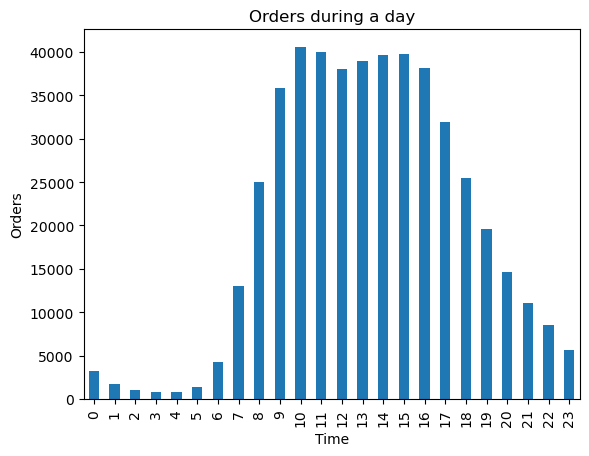

In [44]:
orders_by_hour = df_orders.groupby('order_hour_of_day')['order_id'].count().sort_index()
orders_by_hour.plot(kind='bar',
                    title='Orders during a day',
                    xlabel='Time',
                    ylabel='Orders')
plt.show()

Most of the traffic is from 9 to 17.

### [A3] What day of the week do people shop for groceries?

In [45]:
orders_by_dow = df_orders.groupby('order_dow')['order_id'].count().sort_index()
dow_names = list(calendar.day_abbr)
orders_by_dow.index = dow_names

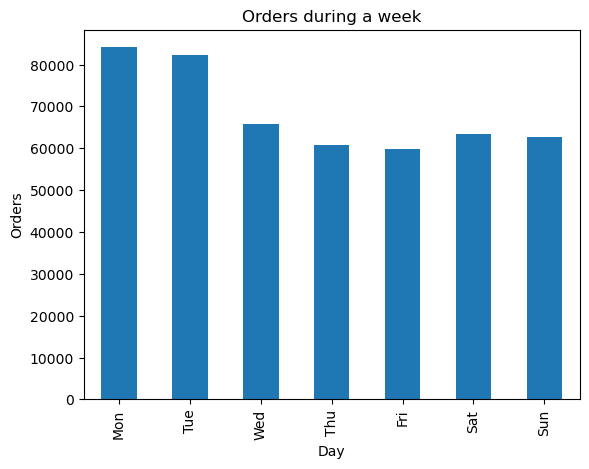

In [46]:
orders_by_dow.plot(kind='bar',
                   title='Orders during a week',
                   xlabel='Day',
                   ylabel='Orders')
plt.show()

The day with the most orders is Monday, followed closely by Tuesday.

### [A4] How long do people wait until placing another order?

In [47]:
print('Average wait time')
df_orders['days_since_prior_order'].mean()

Average wait time


11.101813900274362

In average, people wait 11 days between orders.

In [48]:
q1 = df_orders['days_since_prior_order'].quantile(0.25)
q2 = df_orders['days_since_prior_order'].quantile(0.5)
q3 = df_orders['days_since_prior_order'].quantile(0.75)

print(f'The waiting time quartiles are: {q1}, {q2}, {q3}')

The waiting time quartiles are: 4.0, 7.0, 15.0


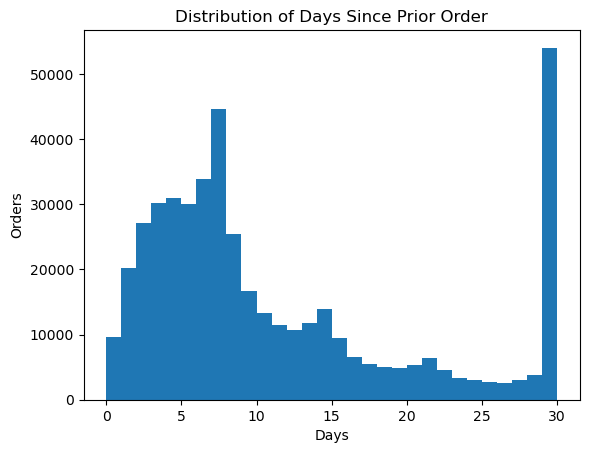

In [49]:
#Plot an histogram for 'days_since_prior_order'. We'll use only one day per bin.
df_orders.hist(column='days_since_prior_order',
               bins=30,
               grid=False)
plt.title('Distribution of Days Since Prior Order')
plt.xlabel('Days')
plt.ylabel('Orders')

plt.show()

The average wait time is 11 days, while the median wait time is 7 days. From looking at the individual counts, the peak at 30 tells us that every time that an order has more than 30 days wait time, it is marked as 30 days.

So that 30 should be read as '30 or more'

# [B] Medium (must complete all to pass)

### [B1] Is there a difference in `'order_hour_of_day'` distributions on Wednesdays and Saturdays? Plot the histograms for both days and describe the differences that you see.

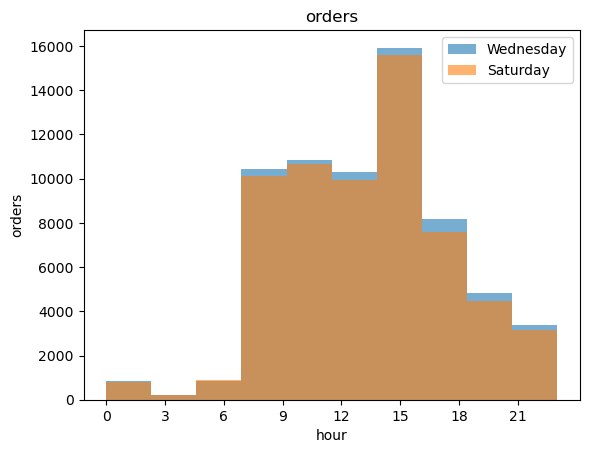

In [50]:
order_hours = df_orders[df_orders['order_dow'] == calendar.WEDNESDAY]['order_hour_of_day']
order_hours.plot(kind='hist',
                 title=('orders'),
                 xticks=[0,3,6,9,12,15,18,21],
                 alpha=0.6
                )

order_hours = df_orders[df_orders['order_dow'] == calendar.SATURDAY]['order_hour_of_day']
order_hours.plot(kind='hist',
                alpha=0.6)
plt.xlabel('hour')
plt.ylabel('orders')
plt.legend(['Wednesday', 'Saturday'])
plt.show()

The distribution of the orders is almost identical. There are slighltly more orders on Wednesdays.

### [B2] What's the distribution for the number of orders per customer?

In [51]:
# What is the most orders by a single client?
orders_per_customer = df_orders.groupby('user_id')['order_id'].count()
orders_per_customer.max()

28

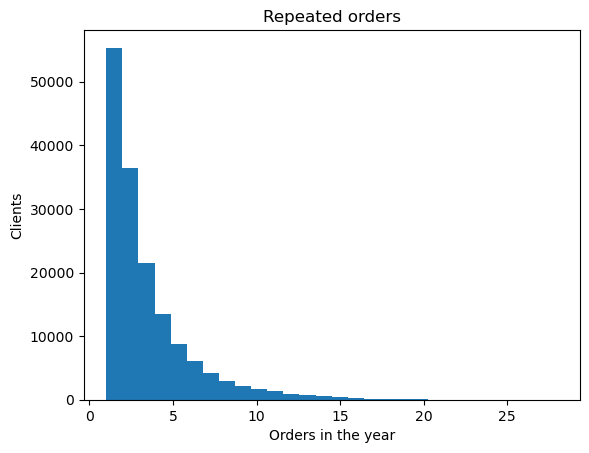

In [52]:
# We can use the previous answer as the bins. It creates a very clear picture
orders_per_customer.plot(kind='hist', bins=28,title='Repeated orders',xlabel='Orders in the year',ylabel='Clients')

plt.xlabel('Orders in the year')
plt.ylabel('Clients')
plt.show()

### [B3] What are the top 20 popular products (display their id and name)?

In [53]:
# Count the products and rename the series.
# Renaming is required for the merge in the next cell
product_count = df_order_products.groupby('product_id')['product_id'].count()
product_count.name = 'product_count'

In [54]:
# Create a df with the product's id, name and count.
product_names = df_products[['product_id', 'product_name']]
product_count = product_names.merge(product_count,
                                    how="left",
                                    left_on='product_id',
                                    right_index=True                              
                                    )

In [55]:
# Without a reset_index, the index is (product_id - 1),and its easy to confuse
#  one for the other.
# Now it also acts as a ranking. 
# product_count is a float since there are some nan values.

product_count = product_count.sort_values(by='product_count', ascending=False)
product_count = product_count.reset_index(drop=True)

print(product_count.head(20))

    product_id              product_name  product_count
0        24852                    Banana        66050.0
1        13176    Bag of Organic Bananas        53297.0
2        21137      Organic Strawberries        37039.0
3        21903      Organic Baby Spinach        33971.0
4        47209      Organic Hass Avocado        29773.0
5        47766           Organic Avocado        24689.0
6        47626               Large Lemon        21495.0
7        16797              Strawberries        20018.0
8        26209                     Limes        19690.0
9        27845        Organic Whole Milk        19600.0
10       27966       Organic Raspberries        19197.0
11       22935      Organic Yellow Onion        15898.0
12       24964            Organic Garlic        15292.0
13       45007          Organic Zucchini        14584.0
14       39275       Organic Blueberries        13879.0
15       49683            Cucumber Kirby        13675.0
16       28204        Organic Fuji Apple        

These are the 20 most popular items. 

# [C] Hard (must complete at least two to pass)

### [C1] How many items do people typically buy in one order? What does the distribution look like?

In [56]:
item_count = df_order_products.groupby(by='order_id')['product_id'].count()
item_count.name = 'items_count'

In [57]:
print('Max items:')
print(item_count.max())

Max items:
127


Text(0, 0.5, 'Clients')

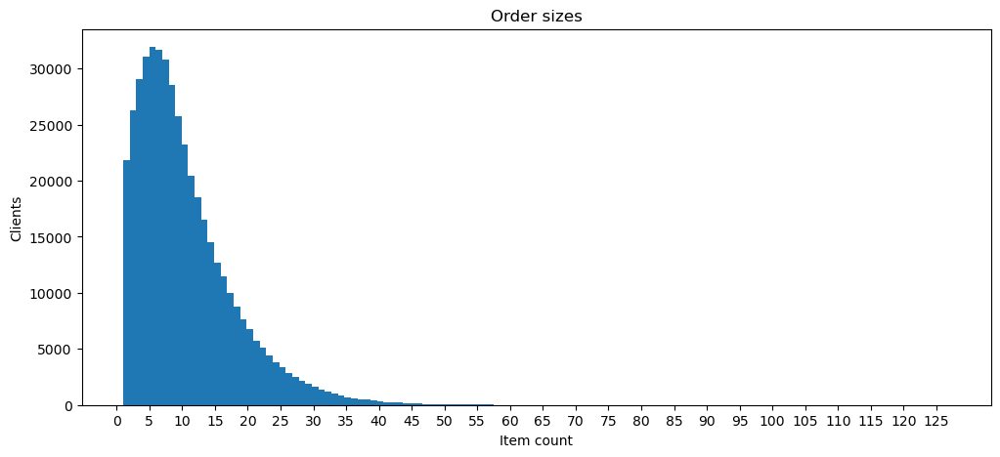

In [58]:
# Using 127 bins gives us the resolution to clearly show the distribution on the lower end,
# were most of the data is located.
fig = item_count.plot(kind='hist',
                      title='Order sizes',
                      bins=127,
                      figsize=[12,5],
                      xticks=np.arange(0, 130, 5)
                     )
fig.set_xlabel('Item count')
fig.set_ylabel('Clients')

In [59]:
q1= item_count.quantile(0.25)
q2= item_count.quantile(0.5)
q3= item_count.quantile(0.75)

mean = item_count.mean()
print(f'The quartiles are:\nQ1: {q1}\nQ2: {q2}\nQ3: {q3}')
print(f'The mean is: {mean:.2f}')

The quartiles are:
Q1: 5.0
Q2: 8.0
Q3: 14.0
The mean is: 10.10


The average order has around 10 items. Half of the orders have between 5 and 14 items.

### [C2] What are the top 20 items that are reordered most frequently (display their names and product IDs)?

In [60]:
# This is similar to the B3 task.
# We can add a query for 'reordered == 1', and then reuse the rest of the code
product_count = df_order_products.query('reordered == 1')
product_count = product_count.groupby('product_id')['order_id'].count()
product_count.name = 'product_count'

In [61]:
# Create a df with the product's id, name and count.
product_names = df_products[['product_id', 'product_name']]
product_count = product_names.merge(product_count,
                                    how="left",
                                    left_on='product_id',
                                    right_index=True                              
                                    )

In [62]:
# Without a reset_index, the index is (product_id - 1), and its easy to confuse one for the other
# Now it also acts as a ranking 
# product_count is a float since there are some nan values.
product_count = product_count.sort_values(by='product_count', ascending=False)
product_count = product_count.reset_index(drop=True)
print(product_count.head(20))

    product_id              product_name  product_count
0        24852                    Banana        55763.0
1        13176    Bag of Organic Bananas        44450.0
2        21137      Organic Strawberries        28639.0
3        21903      Organic Baby Spinach        26233.0
4        47209      Organic Hass Avocado        23629.0
5        47766           Organic Avocado        18743.0
6        27845        Organic Whole Milk        16251.0
7        47626               Large Lemon        15044.0
8        27966       Organic Raspberries        14748.0
9        16797              Strawberries        13945.0
10       26209                     Limes        13327.0
11       22935      Organic Yellow Onion        11145.0
12       24964            Organic Garlic        10411.0
13       45007          Organic Zucchini        10076.0
14       49683            Cucumber Kirby         9538.0
15       28204        Organic Fuji Apple         8989.0
16        8277  Apple Honeycrisp Organic        

With a small change to the code, we got the top 20 most reordered items.

### [C3] For each product, what proportion of its orders are reorders?

In [63]:
# We can find this by grouping by product_id and calculating the mean of reordered
# We can add the orders count, to give context to the mean

agg_dict = {'reordered':'mean', 
            'order_id':'count'
           }
column_names = ['reorder_mean', 'order_count']
reorder_mean = df_order_products.groupby('product_id').agg(agg_dict)
reorder_mean.columns = column_names

In [64]:
# Add the product names, to improve readability
reorder_mean = reorder_mean.merge(df_products[['product_id', 'product_name']],
                   how='left',
                   left_index=True,
                   right_on='product_id')

In [65]:
# Now we have two axes for a scatter plot.
# Plotly express gives us scatter chart with mouse hover functionality

fig = px.scatter(reorder_mean,
                 title="Product's reorder rates",
                 x='order_count',
                 y='reorder_mean',
                 labels={
                     'order_count': 'Orders',
                     'reorder_mean': 'Reorder rate'
                 },
                 hover_data=['product_name']
                )
fig.show()

For good measure, let's see the products with the best return rates and at least 100 purchases

In [66]:
# Again we reset the index to avoid confusion with product_id, and to have a nice ranking
reorder_mean = reorder_mean.query('order_count > 99')
reorder_mean = reorder_mean.sort_values(by='reorder_mean', ascending=False)
reorder_mean = reorder_mean.reset_index(drop=True).head(20)

### [C4] For each customer, what proportion of their products ordered are reorders?

This task is similar to the last one. We can reuse a lot of that code.

In [67]:
# We can find this by grouping by user_id and calculating the mean of reordered
# This time we need to merge the user_id from df_orders
# We can add the products count, to give context to the mean

user_reorders = df_order_products.merge(df_orders[['order_id', 'user_id']],
                                        how='left',
                                        on='order_id')

agg_dict = {'reordered':'mean', 
            'product_id':'count'
           }
column_names = ['reorder_mean', 'products_count']
user_reorders = user_reorders.groupby('user_id').agg(agg_dict)
user_reorders.columns = column_names

In [68]:
# We need to create a column with the user_id, to use it with plotly hover_data
user_reorders['user_id']=user_reorders.index

In [69]:
fig = px.scatter(user_reorders,
                 title="User's reorder rates",
                 x='products_count',
                 y='reorder_mean',
                 labels={
                     'products_count': 'Products',
                     'reorder_mean': 'Reorder rate'
                 },
                 hover_data=['user_id']
                )
fig.show()

---

**NOTE**

There is a curious pattern emerging at the left side of the graph. It isn't related specifically to the data that we are visualizing.

It is an artifact created by measuring the ocurrence of a binary event (`0` or `1`, `True` or `False`) over a low amount of tries. There is simply a limited amount of values that that measure can take, and those values create the lines that we see on the left side.

For example: A user that purchased 3 products can only have a reorder rate of:
- 0: no reorders
- 0.33: 1 reorder
- 0.66: 2 reorders
- 1: all 3 are reorders

The same lines appear in the Product's reorder rate chart, but since most orders count are in the thousands, you need to zoom very close to the edge to see them.

---

This time lets take a look at the users with the lowest reorder rates and at least 80 products purchased. Let's see who likes some novelty in their shopping cart.

In [70]:
user_reorders.query('products_count > 79').sort_values(by='reorder_mean').head(20)

,reorder_mean,products_count,user_id
user_id,,,
155405,0.066667,90,155405
10009,0.084211,95,10009
125552,0.102041,98,125552
2824,0.108434,83,2824
171442,0.125000,88,171442
203662,0.137500,80,203662
15516,0.139535,86,15516
49157,0.142857,84,49157
103624,0.144144,111,103624


### [C5] What are the top 20 items that people put in their carts first? 

In [71]:
# First lets get all the items that were added to the cart first
first_items = df_order_products.query('add_to_cart_order == 1')

In [72]:
# Now lets count how many times each one appears
first_items = first_items.groupby('product_id')['order_id'].count()
first_items.name = 'order_count'

In [73]:
# Find the top 20
first_items = first_items.sort_values(ascending=False).head(20)

In [74]:
# Add the product names
first_items = df_products[['product_id', 'product_name']].merge(first_items,
                                                                how='right',
                                                                left_on='product_id',
                                                                right_index=True)


In [75]:
# Reset the index and print
first_items = first_items.reset_index(drop=True)
print(first_items)

    product_id                 product_name  order_count
0        24852                       Banana        15562
1        13176       Bag of Organic Bananas        11026
2        27845           Organic Whole Milk         4363
3        21137         Organic Strawberries         3946
4        47209         Organic Hass Avocado         3390
5        21903         Organic Baby Spinach         3336
6        47766              Organic Avocado         3044
7        19660                 Spring Water         2336
8        16797                 Strawberries         2308
9        27966          Organic Raspberries         2024
10       44632   Sparkling Water Grapefruit         1914
11       49235          Organic Half & Half         1797
12       47626                  Large Lemon         1737
13         196                         Soda         1733
14       38689     Organic Reduced Fat Milk         1397
15       26209                        Limes         1370
16       12341                H